In [54]:
# --- Imports ---
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import pickle
import warnings
warnings.filterwarnings('ignore')

sns.set(style='whitegrid')
pd.set_option('display.max_columns', 200)


In [55]:
# Update path if needed
DATA_PATH = 'marketing_campaign.xlsx'

REF_DATE = pd.to_datetime('2025-10-09')

if not os.path.exists(DATA_PATH):
    raise FileNotFoundError(f"Dataset not found at {DATA_PATH}. Upload it to /mnt/data/")

# Load
df = pd.read_excel(DATA_PATH)
print('Initial shape:', df.shape)

Initial shape: (2240, 29)


In [56]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

In [57]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,2013-07-10 10:01:42.857142784,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,2013-01-16 00:00:00,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,2013-07-08 12:00:00,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,2013-12-30 06:00:00,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,NaN,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274


In [58]:
#to decide to drop or fill the missing values
(df.isnull().sum() / len(df)) * 100

ID                     0.000000
Year_Birth             0.000000
Education              0.000000
Marital_Status         0.000000
Income                 1.071429
Kidhome                0.000000
Teenhome               0.000000
Dt_Customer            0.000000
Recency                0.000000
MntWines               0.000000
MntFruits              0.000000
MntMeatProducts        0.000000
MntFishProducts        0.000000
MntSweetProducts       0.000000
MntGoldProds           0.000000
NumDealsPurchases      0.000000
NumWebPurchases        0.000000
NumCatalogPurchases    0.000000
NumStorePurchases      0.000000
NumWebVisitsMonth      0.000000
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Z_CostContact          0.000000
Z_Revenue              0.000000
Response               0.000000
dtype: float64

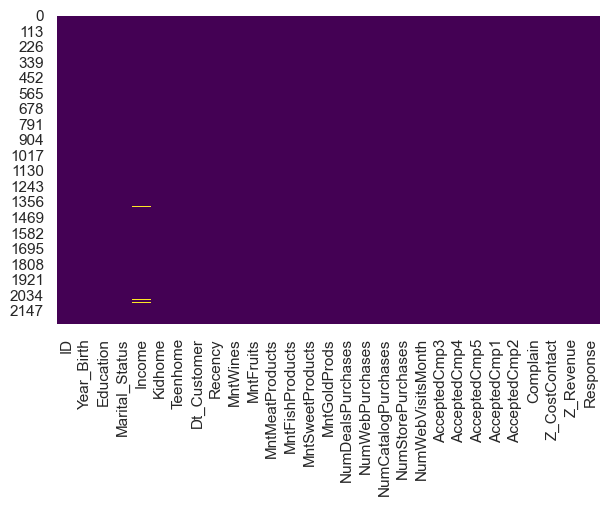

In [59]:
plt.figure(figsize=(7,4))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.show()

In [60]:
# ## Part A — Data Preprocessing & Cleaning (separate)

# %%
# 1. Inspect columns and top rows
print('\nColumns:')
print(df.columns.tolist())
print('\nData types and non-null counts:')
print(df.info())
df['Income'].fillna(df['Income'].median(), inplace=True)
print('\nMissing values per column:')
print(df.isnull().sum())


Columns:
['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response']

Data types and non-null counts:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5

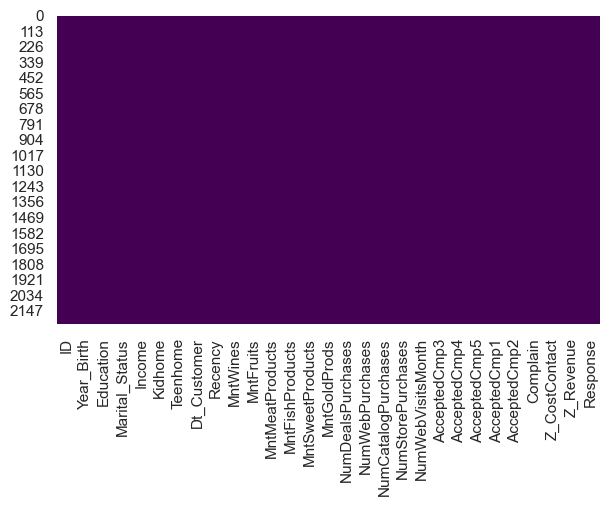

In [61]:
plt.figure(figsize=(7,4))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.show()

In [62]:
# 2. Drop duplicates
dup_count = df.duplicated().sum()
print('\nDuplicate rows:', dup_count)
if dup_count > 0:
    df.drop_duplicates(inplace=True)


Duplicate rows: 0


In [63]:
# 3. Convert dates and create tenure if Dt_Customer exists
if 'Dt_Customer' in df.columns:
    df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], errors='coerce')
    df['Customer_Tenure_Days'] = (REF_DATE - df['Dt_Customer']).dt.days
    print('\nCustomer_Tenure_Days added. NA count:', df['Customer_Tenure_Days'].isnull().sum())



Customer_Tenure_Days added. NA count: 0


In [64]:
# 4. Create Age from Year_Birth (then drop Year_Birth if present)
if 'Year_Birth' in df.columns:
    df['Age'] = REF_DATE.year - df['Year_Birth']
    # drop original birth year to avoid redundancy
    df.drop(columns=['Year_Birth'], inplace=True)
    print('\nAge column created.')


Age column created.


In [65]:
# 5. Create TotalSpend from Mnt* columns
spend_cols = [c for c in df.columns if c.startswith('Mnt')]
print('\nSpend columns detected:', spend_cols)
if spend_cols:
    df['TotalSpend'] = df[spend_cols].sum(axis=1)
    print('TotalSpend created.')

# %%
# 6. Family size
if set(['Kidhome','Teenhome']).issubset(df.columns):
    df['Family_Size'] = df['Kidhome'] + df['Teenhome'] + 1
    print('\nFamily_Size created.')


Spend columns detected: ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
TotalSpend created.

Family_Size created.


In [66]:
# 7. Campaign aggregated features
cmp_cols = [c for c in df.columns if c.startswith('AcceptedCmp')]
if cmp_cols:
    df['CampaignAcceptedCount'] = df[cmp_cols].sum(axis=1)
    df['AcceptedAnyCampaign'] = (df['CampaignAcceptedCount'] > 0).astype(int)
    print('\nCampaign aggregated features created.')

# %%
# 8. Behavior ratios
with np.errstate(divide='ignore', invalid='ignore'):
    if 'NumWebVisitsMonth' in df.columns:
        df['Spend_per_Visit'] = df['TotalSpend'] / (df['NumWebVisitsMonth'] + 1)
    if 'NumWebPurchases' in df.columns:
        df['Deal_Ratio'] = df['NumDealsPurchases'] / (df['NumWebPurchases'] + 1)

# Replace infs
df.replace([np.inf, -np.inf], np.nan, inplace=True)


Campaign aggregated features created.


In [67]:
if 'Income' in df.columns:
    n_missing_income = df['Income'].isnull().sum()
    print('\nMissing Income count before:', n_missing_income)
    if n_missing_income > 0:
        # group median by Education
        if 'Education' in df.columns:
            df['Income'] = df.groupby('Education')['Income'].transform(lambda x: x.fillna(x.median()))
        # fallback to global median
        df['Income'].fillna(df['Income'].median(), inplace=True)
    print('Missing Income after imputation:', df['Income'].isnull().sum())


Missing Income count before: 0
Missing Income after imputation: 0


In [68]:
# 9. Impute other numeric columns with median (to prepare for modeling)
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
# Exclude target-like columns we don't want to impute specially
# We'll impute all numeric features used later
from sklearn.impute import SimpleImputer
num_imp = SimpleImputer(strategy='median')
df[numeric_cols] = num_imp.fit_transform(df[numeric_cols])
print('\nNumeric imputation done. Any NaNs left (numeric)?', df[numeric_cols].isnull().sum().sum())



Numeric imputation done. Any NaNs left (numeric)? 0


In [69]:
# 10. Handle categorical missing values
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
if cat_cols:
    df[cat_cols] = df[cat_cols].fillna('Missing')
    print('\nCategorical imputation done for:', cat_cols)


Categorical imputation done for: ['Education', 'Marital_Status']


In [70]:
# 11. Outlier treatment (optional): cap Income and TotalSpend at 99th percentile
for col in ['Income','TotalSpend']:
    if col in df.columns:
        upper = df[col].quantile(0.99)
        lower = df[col].quantile(0.01)
        df[col] = df[col].clip(lower, upper)
        print(f'Clipped {col} to 1st-99th percentiles')


Clipped Income to 1st-99th percentiles
Clipped TotalSpend to 1st-99th percentiles


In [71]:
# 12. Drop obvious identifier columns if present (safe drop)
drop_candidates = [c for c in ['ID','Id','Customer_ID','Customer Id'] if c in df.columns]
if drop_candidates:
    df.drop(columns=drop_candidates, inplace=True)
    print('\nDropped identifier columns:', drop_candidates)

print('\nPreprocessing complete. Shape now:', df.shape)


Dropped identifier columns: ['ID']

Preprocessing complete. Shape now: (2240, 35)


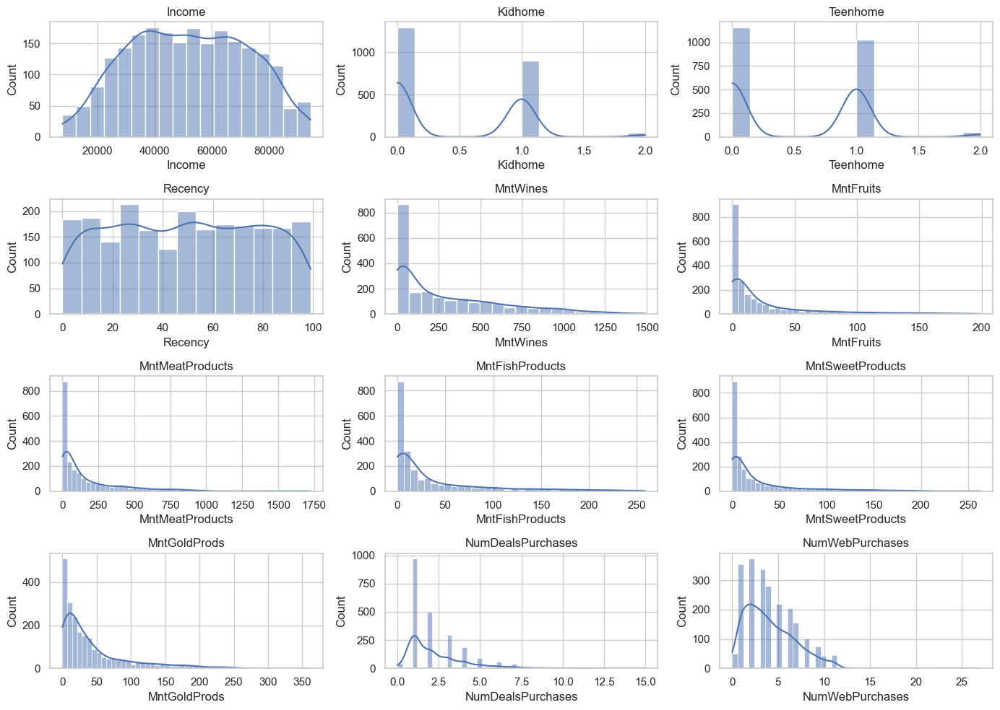

In [72]:

# 1. Univariate: numeric distributions
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
plt.figure(figsize=(14, 10))
for i, col in enumerate([c for c in num_cols if c not in ['Response','AcceptedAnyCampaign']][:12]):
    plt.subplot(4,3,i+1)
    sns.histplot(df[col], kde=True)
    plt.title(col)
plt.tight_layout(); plt.show()


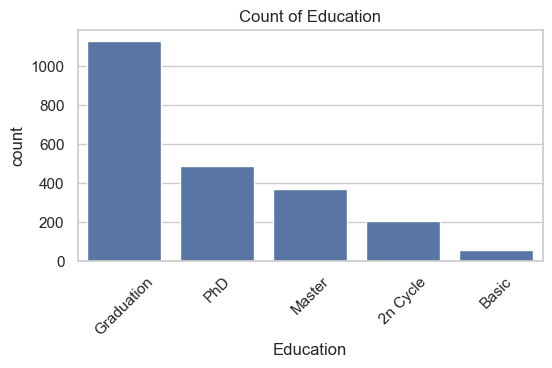

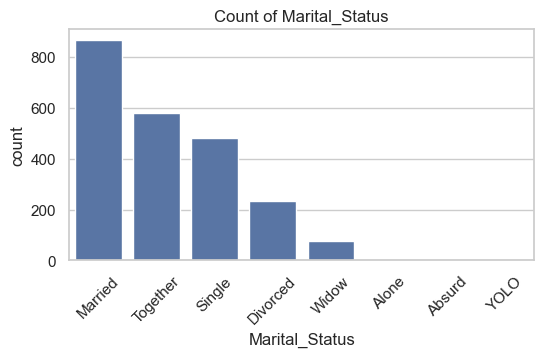

In [73]:
# 2. Univariate: categorical counts
for c in cat_cols:
    plt.figure(figsize=(6,3))
    sns.countplot(data=df, x=c, order=df[c].value_counts().index)
    plt.xticks(rotation=45)
    plt.title(f'Count of {c}')
    plt.show()

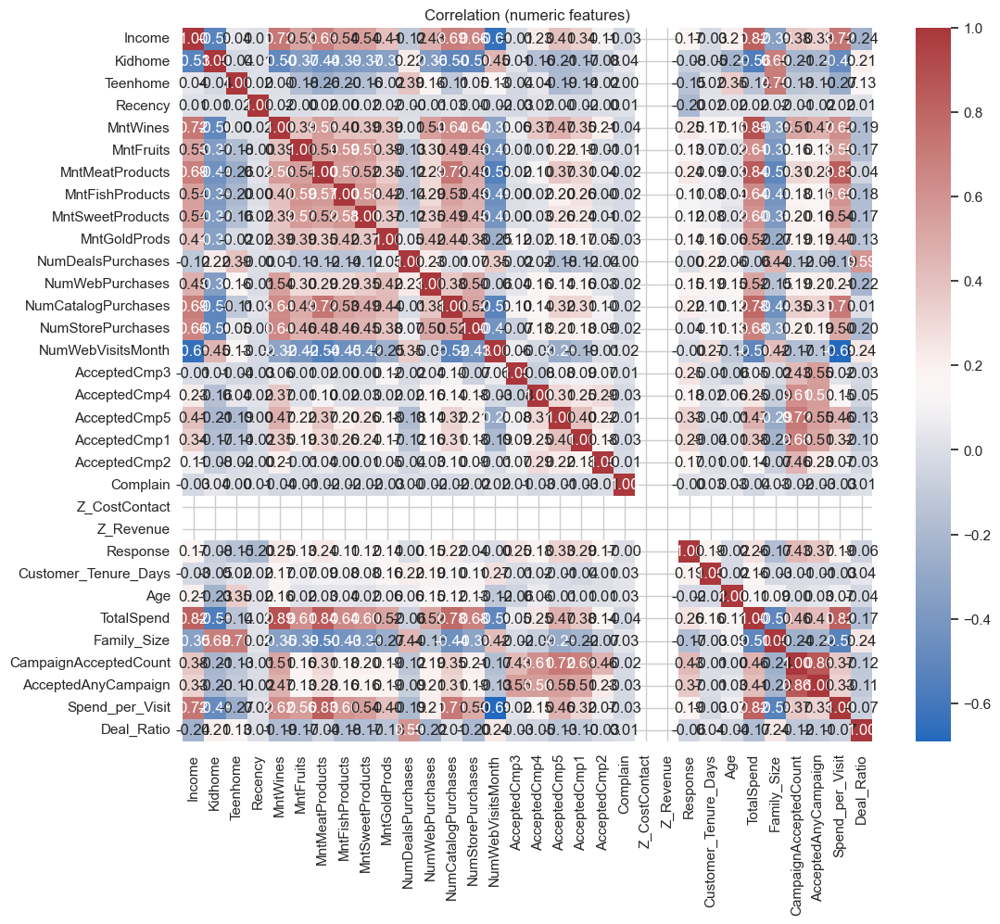

strong positive correlation between TotalSpend and Mnt* columns;Income vs TotalSpend correlation above.


In [74]:
# 3. Bivariate: Correlation heatmap (numeric only)
plt.figure(figsize=(12,10))
corr = df[num_cols].corr()
sns.heatmap(corr, annot=True, fmt='.2f', cmap='vlag')
plt.title('Correlation (numeric features)')
plt.show()

# Insight
print('strong positive correlation between TotalSpend and Mnt* columns;Income vs TotalSpend correlation above.')


In [75]:
# 4. Who purchased more? - Top spenders and by demographic groups
# Top 10 customers by TotalSpend
if 'TotalSpend' in df.columns:
    top10 = df.sort_values('TotalSpend', ascending=False).head(10)[['TotalSpend','Income','Age','Family_Size','Education','Marital_Status']]
    print('\nTop 10 customers by TotalSpend:')
    display(top10)


Top 10 customers by TotalSpend:


,TotalSpend,Income,Age,Family_Size,Education,Marital_Status
1288,2126.0,83151.0,53.0,1.0,Master,Married
1458,2126.0,93790.0,55.0,1.0,Graduation,Single
1010,2126.0,77568.0,46.0,2.0,Graduation,Together
1052,2126.0,69098.0,76.0,1.0,PhD,Married
644,2126.0,77632.0,78.0,1.0,Master,Together
1179,2126.0,90638.0,34.0,1.0,Master,Single
77,2126.0,75825.0,49.0,1.0,Graduation,Single
1259,2126.0,76653.0,56.0,1.0,Graduation,Together
1280,2126.0,78687.0,42.0,1.0,Graduation,Together
1301,2126.0,94384.0,72.0,1.0,Graduation,Together



Average TotalSpend by Education:


,count,mean,median
Education,,,
PhD,486,671.602881,493.0
Graduation,1127,618.212955,414.0
Master,370,607.856757,387.5
2n Cycle,203,495.881773,198.0
Basic,54,81.796296,57.0


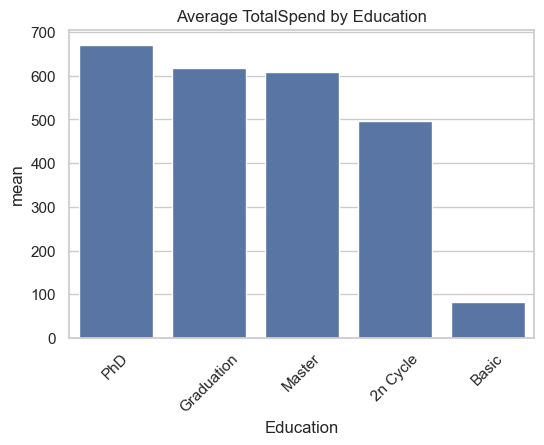

In [76]:
# Spend by Education
if 'Education' in df.columns:
    edu_spend = df.groupby('Education')['TotalSpend'].agg(['count','mean','median']).sort_values('mean', ascending=False)
    print('\nAverage TotalSpend by Education:')
    display(edu_spend)
    plt.figure(figsize=(6,4))
    sns.barplot(x=edu_spend.index, y=edu_spend['mean'])
    plt.title('Average TotalSpend by Education')
    plt.xticks(rotation=45); plt.show()


Average TotalSpend by Marital_Status:


,count,mean
Marital_Status,,
Absurd,2,1192.500000
Widow,77,738.818182
Divorced,232,610.719828
Together,580,606.043103
Single,480,604.016667
Married,864,589.237269
YOLO,2,424.000000
Alone,3,256.666667


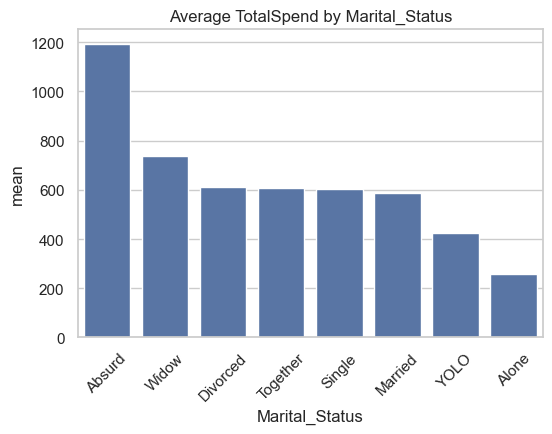

In [77]:
# Spend by Marital Status
if 'Marital_Status' in df.columns:
    ms_spend = df.groupby('Marital_Status')['TotalSpend'].agg(['count','mean']).sort_values('mean', ascending=False)
    print('\nAverage TotalSpend by Marital_Status:')
    display(ms_spend)
    plt.figure(figsize=(6,4))
    sns.barplot(x=ms_spend.index, y=ms_spend['mean'])
    plt.title('Average TotalSpend by Marital_Status')
    plt.xticks(rotation=45); plt.show()

In [78]:
# 5. Campaign analysis: who accepted campaigns and response rate
if 'Response' in df.columns:
    overall_response_rate = df['Response'].mean()
    print(f'Overall response rate (last campaign): {overall_response_rate:.3f}')

Overall response rate (last campaign): 0.149



Response rate by Education:


Education
PhD           0.207819
Master        0.154054
Graduation    0.134871
2n Cycle      0.108374
Basic         0.037037
Name: Response, dtype: float64

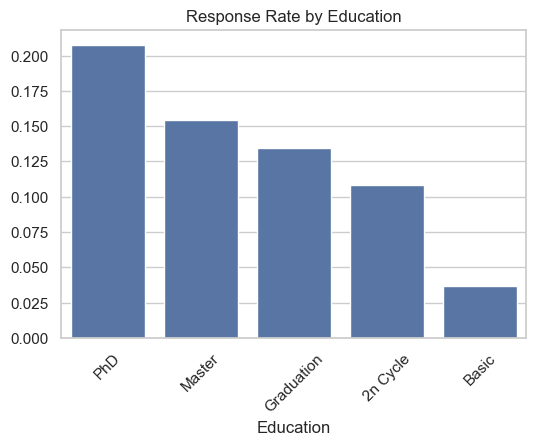

In [79]:
# Acceptance by Education
if 'Education' in df.columns and 'Response' in df.columns:
    edu_response = df.groupby('Education')['Response'].mean().sort_values(ascending=False)
    print('\nResponse rate by Education:')
    display(edu_response)
    plt.figure(figsize=(6,4))
    sns.barplot(x=edu_response.index, y=edu_response.values)
    plt.title('Response Rate by Education'); plt.xticks(rotation=45); plt.show()

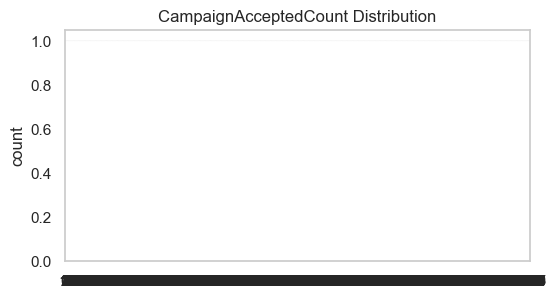

In [80]:
# CampaignAcceptedCount distribution
if 'CampaignAcceptedCount' in df.columns:
    plt.figure(figsize=(6,3))
    sns.countplot(df['CampaignAcceptedCount']); plt.title('CampaignAcceptedCount Distribution'); plt.show()

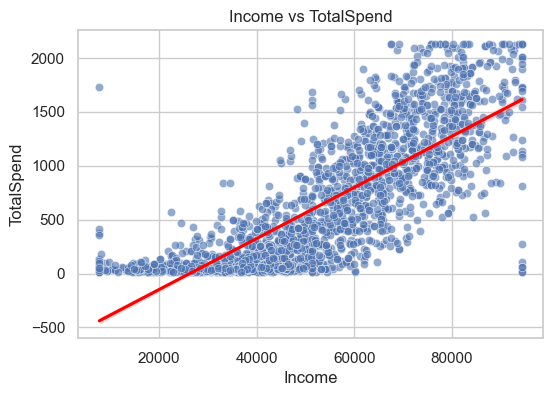

In [81]:
# 6. Relationship visualizations
# Income vs TotalSpend
if 'Income' in df.columns and 'TotalSpend' in df.columns:
    plt.figure(figsize=(6,4))
    sns.scatterplot(data=df, x='Income', y='TotalSpend', alpha=0.6)
    sns.regplot(data=df, x='Income', y='TotalSpend', scatter=False, color='red')
    plt.title('Income vs TotalSpend')
    plt.show()

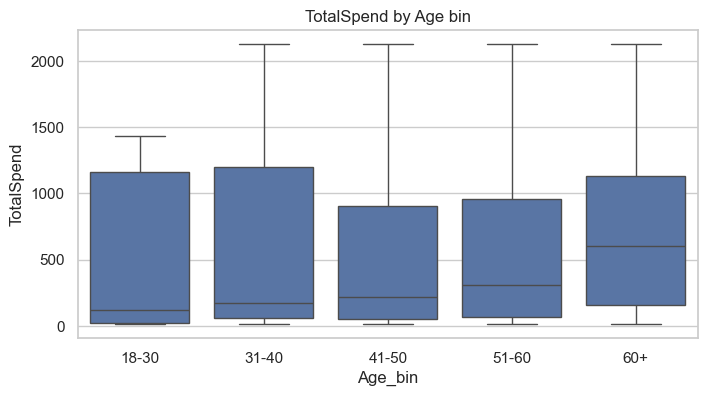

In [82]:
# Age vs TotalSpend boxplot by Age bins
if 'Age' in df.columns:
    df['Age_bin'] = pd.cut(df['Age'], bins=[17,30,40,50,60,100], labels=['18-30','31-40','41-50','51-60','60+'])
    plt.figure(figsize=(8,4))
    sns.boxplot(data=df, x='Age_bin', y='TotalSpend')
    plt.title('TotalSpend by Age bin'); plt.show()

count    2240.000000
mean       33.608842
std        11.845494
min         2.827633
25%        24.999372
50%        33.301753
75%        41.522494
max        77.838471
Name: Loyalty_Score, dtype: float64


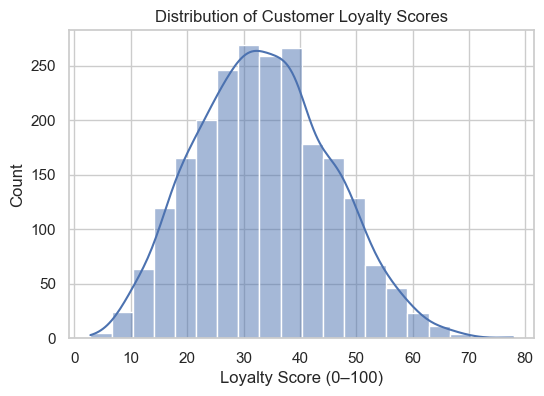

In [83]:
from sklearn.preprocessing import MinMaxScaler

# select loyalty-related features (check if they exist)
loyalty_features = ['Recency', 'NumStorePurchases', 'NumWebPurchases', 'CampaignAcceptedCount', 'Customer_Tenure_Days']
available = [f for f in loyalty_features if f in df.columns]

# scale 0-1
scaler_loyal = MinMaxScaler()
scaled = pd.DataFrame(scaler_loyal.fit_transform(df[available]), columns=available)

# build Loyalty Score
df['Loyalty_Score'] = (
    0.25*(1 - scaled['Recency']) +
    0.20*scaled['NumStorePurchases'] +
    0.20*scaled['NumWebPurchases'] +
    0.20*scaled['CampaignAcceptedCount'] +
    0.15*scaled['Customer_Tenure_Days']
) * 100  # convert to 0–100 scale

# show basic stats
print(df['Loyalty_Score'].describe())

# visualize
plt.figure(figsize=(6,4))
sns.histplot(df['Loyalty_Score'], bins=20, kde=True)
plt.title('Distribution of Customer Loyalty Scores')
plt.xlabel('Loyalty Score (0–100)')
plt.show()


In [84]:
# Insight summary of EDA
print('\nEDA Insights Summary:')
print('- TotalSpend correlates strongly with Mnt* product columns (expected).')
print('- Income has moderate positive relationship with TotalSpend (see scatter).')
print('- Certain education groups (check bar plots) show higher average spend.')
print('- Campaign acceptance varies by Education and customer behaviour features.')


EDA Insights Summary:
- TotalSpend correlates strongly with Mnt* product columns (expected).
- Income has moderate positive relationship with TotalSpend (see scatter).
- Certain education groups (check bar plots) show higher average spend.
- Campaign acceptance varies by Education and customer behaviour features.


In [85]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [86]:
# 1. Feature selection for clustering
cluster_features = [f for f in ['Income','Age','TotalSpend','Family_Size','Recency','NumWebPurchases',
                                'NumStorePurchases','NumCatalogPurchases','NumWebVisitsMonth','Spend_per_Visit',
                                'Deal_Ratio','CampaignAcceptedCount','Customer_Tenure_Days'] if f in df.columns]
print('\nSelected features for clustering:', cluster_features)

# Encode categorical features (Education, Marital_Status) as extra features
cat_to_encode = [c for c in ['Education','Marital_Status'] if c in df.columns]
encoded_df = pd.DataFrame()
for c in cat_to_encode:
    encoded_df[c+'_enc'] = df[c].astype('category').cat.codes
    cluster_features.append(c+'_enc')




Selected features for clustering: ['Income', 'Age', 'TotalSpend', 'Family_Size', 'Recency', 'NumWebPurchases', 'NumStorePurchases', 'NumCatalogPurchases', 'NumWebVisitsMonth', 'Spend_per_Visit', 'Deal_Ratio', 'CampaignAcceptedCount', 'Customer_Tenure_Days']


In [87]:
# Build feature matrix

existing_features = [f for f in cluster_features if f in df.columns]
X = df[existing_features].copy()
print("Using features:", existing_features)

print('Feature matrix shape:', X.shape)


Using features: ['Income', 'Age', 'TotalSpend', 'Family_Size', 'Recency', 'NumWebPurchases', 'NumStorePurchases', 'NumCatalogPurchases', 'NumWebVisitsMonth', 'Spend_per_Visit', 'Deal_Ratio', 'CampaignAcceptedCount', 'Customer_Tenure_Days']
Feature matrix shape: (2240, 13)


In [88]:
# 2. Imputation & scaling (again, ensure no NaNs)
num_imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(num_imputer.fit_transform(X), columns=X.columns)
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X.columns)


PCA explained variance (2 comps): [0.38809961 0.10939925]


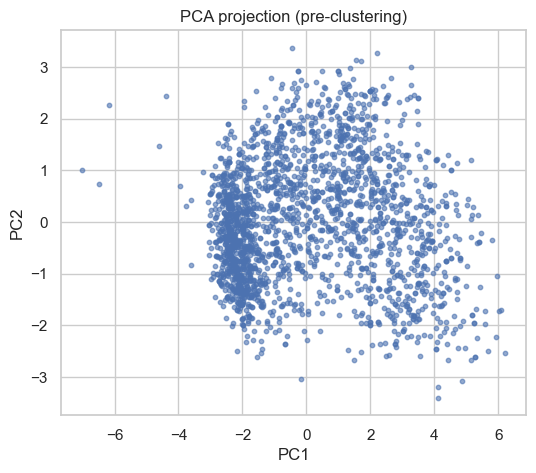

In [89]:
# 3. PCA for visualization
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)
print('\nPCA explained variance (2 comps):', pca.explained_variance_ratio_)

plt.figure(figsize=(6,5))
plt.scatter(X_pca[:,0], X_pca[:,1], s=10, alpha=0.6)
plt.title('PCA projection (pre-clustering)'); plt.xlabel('PC1'); plt.ylabel('PC2'); plt.show()

In [90]:
# 4. Clustering: KMeans (k 2..10)
inertia, sil_scores, db_scores, ch_scores = [], [], [], []
K_range = range(2, 11)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=20)
    labels = km.fit_predict(X_scaled)
    inertia.append(km.inertia_)
    sil_scores.append(silhouette_score(X_scaled, labels))
    db_scores.append(davies_bouldin_score(X_scaled, labels))
    ch_scores.append(calinski_harabasz_score(X_scaled, labels))
    print(f'K={k} | Silhouette={sil_scores[-1]:.4f} | DB={db_scores[-1]:.4f} | CH={ch_scores[-1]:.2f}')

K=2 | Silhouette=0.2996 | DB=1.4095 | CH=960.74
K=3 | Silhouette=0.2238 | DB=1.7219 | CH=688.43
K=4 | Silhouette=0.1460 | DB=2.0041 | CH=534.17
K=5 | Silhouette=0.1510 | DB=1.6912 | CH=518.47
K=6 | Silhouette=0.1548 | DB=1.6417 | CH=478.10
K=7 | Silhouette=0.1523 | DB=1.7059 | CH=435.71
K=8 | Silhouette=0.1311 | DB=1.7748 | CH=402.29
K=9 | Silhouette=0.1302 | DB=1.7425 | CH=376.04
K=10 | Silhouette=0.1334 | DB=1.7493 | CH=352.62


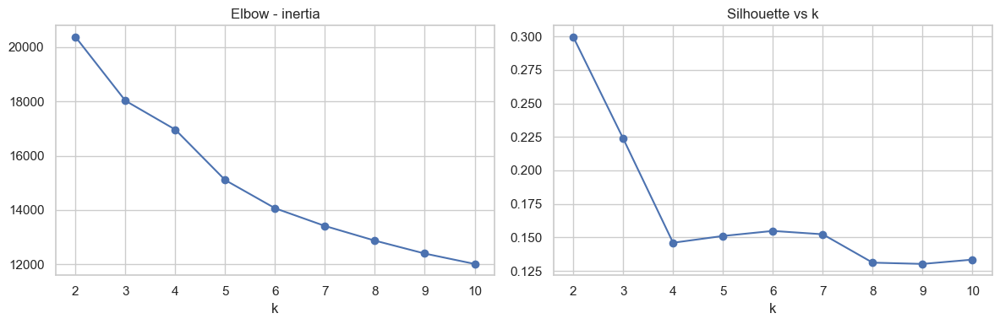

In [91]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1); plt.plot(list(K_range), inertia, marker='o'); plt.title('Elbow - inertia'); plt.xlabel('k')
plt.subplot(1,2,2); plt.plot(list(K_range), sil_scores, marker='o'); plt.title('Silhouette vs k'); plt.xlabel('k')
plt.tight_layout(); plt.show()




Best k by silhouette: 2
KMeans silhouette: 0.29957358013627683


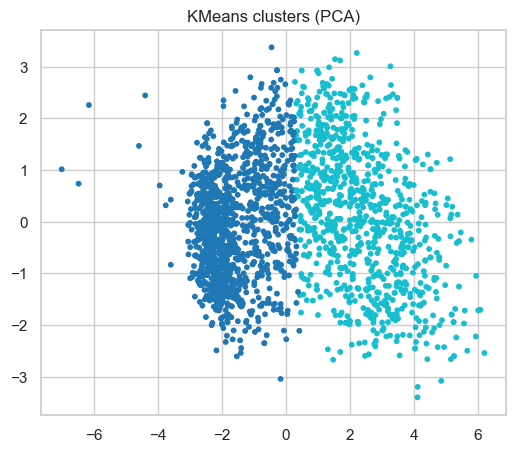

In [92]:
best_k = int(K_range[np.argmax(sil_scores)])
print('\nBest k by silhouette:', best_k)

kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=30)
k_labels = kmeans.fit_predict(X_scaled)
df['Cluster_KMeans'] = k_labels
print('KMeans silhouette:', silhouette_score(X_scaled, k_labels))

plt.figure(figsize=(6,5)); plt.scatter(X_pca[:,0], X_pca[:,1], c=k_labels, cmap='tab10', s=10); plt.title('KMeans clusters (PCA)'); plt.show()

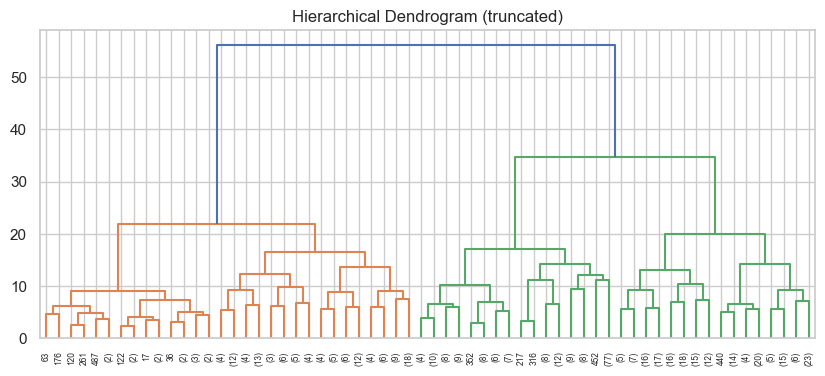

In [93]:
# 5. Hierarchical clustering (Ward) - dendrogram sample + flat clustering
X_scaled_df = X_scaled.copy()
sample_df = X_scaled_df.sample(n=min(500, X_scaled_df.shape[0]), random_state=42)
Z = linkage(sample_df, method='ward')
plt.figure(figsize=(10,4)); dendrogram(Z, truncate_mode='level', p=5); plt.title('Hierarchical Dendrogram (truncated)'); plt.show()



Hierarchical silhouette: 0.25514608482437495


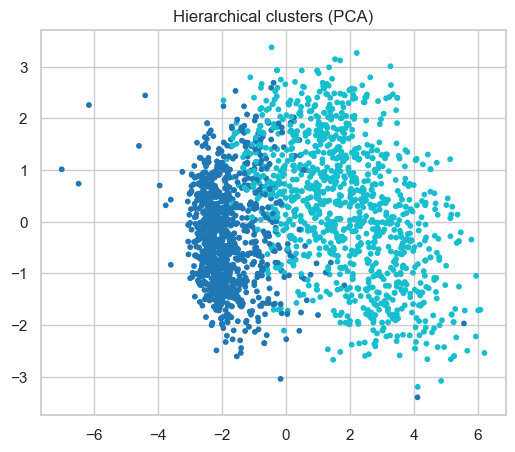

In [94]:
hier_full = linkage(X_scaled_df, method='ward')
hier_labels = fcluster(hier_full, t=best_k, criterion='maxclust') - 1
df['Cluster_Hier'] = hier_labels
print('Hierarchical silhouette:', silhouette_score(X_scaled, hier_labels))

plt.figure(figsize=(6,5)); plt.scatter(X_pca[:,0], X_pca[:,1], c=hier_labels, cmap='tab10', s=10); plt.title('Hierarchical clusters (PCA)'); plt.show()

DBSCAN eps=0.8, ms=5 -> clusters=10, silhouette=-0.2720
DBSCAN eps=0.8, ms=10 -> clusters=4, silhouette=-0.1914
DBSCAN eps=1.0, ms=5 -> clusters=11, silhouette=-0.2504
DBSCAN eps=1.0, ms=10 -> clusters=3, silhouette=-0.1206

Best DBSCAN: 1.0 10 silhouette: -0.12058771020781826


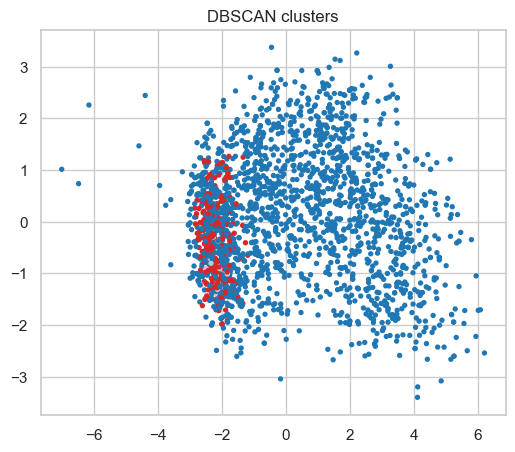

In [95]:
# 6. DBSCAN (grid search)
eps_values = [0.3, 0.5, 0.8, 1.0]
min_samples_values = [5, 10, 20]
best_db = None
best_db_score = -1
for eps in eps_values:
    for ms in min_samples_values:
        db = DBSCAN(eps=eps, min_samples=ms)
        labels_db = db.fit_predict(X_scaled)
        n_clusters = len(set(labels_db)) - (1 if -1 in labels_db else 0)
        if n_clusters <= 1:
            continue
        sil = silhouette_score(X_scaled, labels_db)
        print(f'DBSCAN eps={eps}, ms={ms} -> clusters={n_clusters}, silhouette={sil:.4f}')
        if sil > best_db_score:
            best_db_score = sil
            best_db = (eps, ms, labels_db)

if best_db:
    eps, ms, labels_db = best_db
    df['Cluster_DBSCAN'] = labels_db
    print('\nBest DBSCAN:', eps, ms, 'silhouette:', best_db_score)
    plt.figure(figsize=(6,5)); plt.scatter(X_pca[:,0], X_pca[:,1], c=labels_db, cmap='tab20', s=8); plt.title('DBSCAN clusters'); plt.show()
else:
    print('\nDBSCAN: no useful clustering found with tried grid.')

GMM k=2 -> Silhouette=0.2735
GMM k=3 -> Silhouette=0.1985
GMM k=4 -> Silhouette=0.1329
GMM k=5 -> Silhouette=0.0497
GMM k=6 -> Silhouette=0.0918
GMM k=7 -> Silhouette=0.0918
GMM k=8 -> Silhouette=0.0706
GMM k=9 -> Silhouette=0.0795
GMM k=10 -> Silhouette=0.0523

Best GMM k: 2 silhouette: 0.2735419541657383


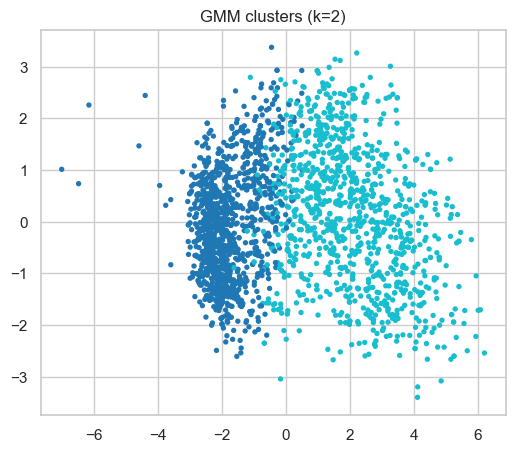

In [96]:
# 7. Gaussian Mixture Model (GMM)
best_gmm = None
best_gmm_score = -1
for k in K_range:
    gmm = GaussianMixture(n_components=k, random_state=42, covariance_type='full', n_init=5)
    labels_gmm = gmm.fit_predict(X_scaled)
    try:
        sil = silhouette_score(X_scaled, labels_gmm)
    except:
        sil = -1
    print(f'GMM k={k} -> Silhouette={sil:.4f}')
    if sil > best_gmm_score:
        best_gmm_score = sil
        best_gmm = (k, gmm, labels_gmm)

if best_gmm:
    k_gmm, gmm_model, labels_gmm = best_gmm
    df['Cluster_GMM'] = labels_gmm
    print('\nBest GMM k:', k_gmm, 'silhouette:', best_gmm_score)
    plt.figure(figsize=(6,5)); plt.scatter(X_pca[:,0], X_pca[:,1], c=labels_gmm, cmap='tab10', s=8); plt.title(f'GMM clusters (k={k_gmm})'); plt.show()


In [97]:
# 8. Model comparison table
models = {}
models['KMeans'] = dict(labels=k_labels, silhouette=silhouette_score(X_scaled, k_labels), db=davies_bouldin_score(X_scaled, k_labels))
models['Hierarchical'] = dict(labels=hier_labels, silhouette=silhouette_score(X_scaled, hier_labels), db=davies_bouldin_score(X_scaled, hier_labels))
if best_db:
    models['DBSCAN'] = dict(labels=labels_db, silhouette=best_db_score, db=davies_bouldin_score(X_scaled, labels_db))
if best_gmm:
    models['GMM'] = dict(labels=labels_gmm, silhouette=best_gmm_score, db=davies_bouldin_score(X_scaled, labels_gmm))

print('\nModel comparison (Silhouette, Davies-Bouldin):')
for name, v in models.items():
    print(f"{name}: silhouette={v['silhouette']:.4f}, db={v['db']:.4f}")


Model comparison (Silhouette, Davies-Bouldin):
KMeans: silhouette=0.2996, db=1.4095
Hierarchical: silhouette=0.2551, db=1.5071
DBSCAN: silhouette=-0.1206, db=1.5668
GMM: silhouette=0.2735, db=1.4579


In [98]:
# 9. Cluster profiling for chosen model (choose best by silhouette)
best_model_name = max(models.items(), key=lambda x: x[1]['silhouette'])[0]
print('\nBest model by silhouette:', best_model_name)
best_labels = models[best_model_name]['labels']
df['Cluster_Best'] = best_labels
cluster_map = {
    1: 'Loyal and Happy',
    0: 'Less Purchase'
}

df['Cluster_Best'] = df['Cluster_Best'].map(cluster_map)




Best model by silhouette: KMeans


In [99]:
profile_features = ['Income','TotalSpend','Age','Family_Size','Recency','CampaignAcceptedCount']
profile = df.groupby('Cluster_Best')[profile_features].agg(['count','mean','median','std']).round(2)
print('\nCluster profile (best model):')
profile


Cluster profile (best model):


Income                              TotalSpend           \
                 count      mean   median       std      count     mean   
Cluster_Best                                                              
Less Purchase     1326  38418.48  38200.5  13830.46       1326   181.46   
Loyal and Happy    914  71133.06  71064.5  11413.52        914  1217.17   

                                  Age                      Family_Size        \
                 median     std count   mean median    std       count  mean   
Cluster_Best                                                                   
Less Purchase      88.5  198.34  1326  54.76   53.0  11.41        1326  2.26   
Loyal and Happy  1163.0  426.96   914  58.28   58.0  12.48         914  1.51   

                             Recency                       \
                median   std   count   mean median    std   
Cluster_Best                                                
Less Purchase      2.0  0.70    1326  48.77   49.0  28.83   
Loyal and Happy    1.0  0.59     914  49.60   51.0  29.16   

                CampaignAcceptedCount                     
                                count  mean median   std  
Cluster_Best                                              
Less Purchase                    1326  0.11    0.0  0.33  
Loyal and Happy                   914  0.58    0.0  0.92

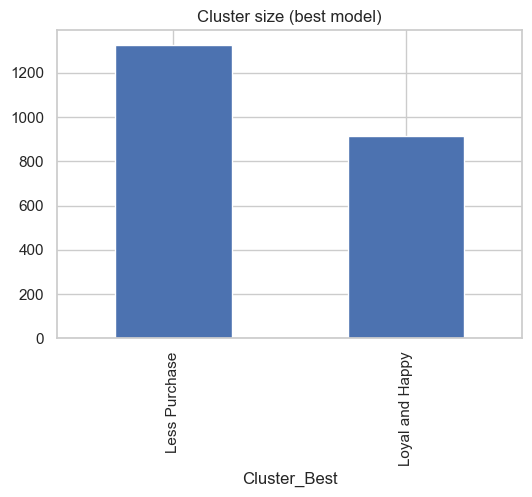

In [100]:
# Visualize cluster sizes
plt.figure(figsize=(6,4)); df['Cluster_Best'].value_counts().sort_index().plot(kind='bar'); plt.title('Cluster size (best model)'); plt.show()



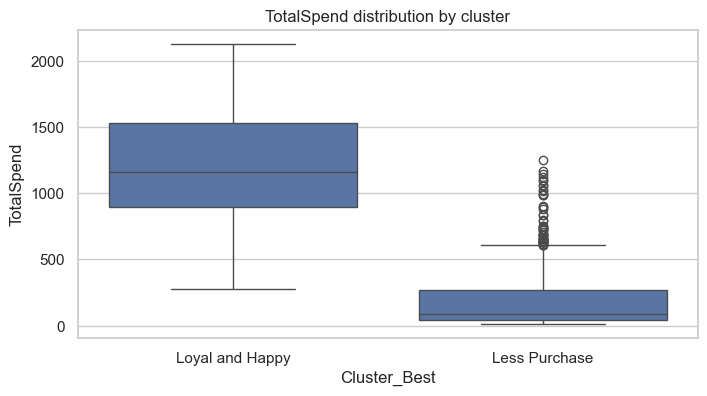

In [101]:
# Spend per cluster
if 'TotalSpend' in df.columns:
    plt.figure(figsize=(8,4))
    sns.boxplot(data=df, x='Cluster_Best', y='TotalSpend')
    plt.title('TotalSpend distribution by cluster'); plt.show()




Response rate by cluster:


Cluster_Best
Less Purchase      0.10
Loyal and Happy    0.22
Name: Response, dtype: float64

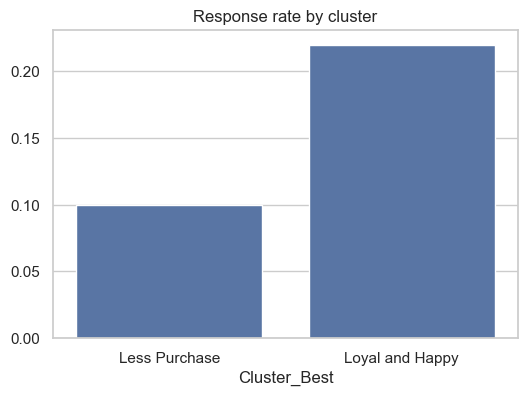

In [102]:
# Campaign acceptance rate per cluster
if 'Response' in df.columns:
    cluster_response = df.groupby('Cluster_Best')['Response'].mean().round(3)
    print('\nResponse rate by cluster:')
    display(cluster_response)
    plt.figure(figsize=(6,4)); sns.barplot(x=cluster_response.index, y=cluster_response.values); plt.title('Response rate by cluster'); plt.show()


In [104]:
print(df.columns)


Index(['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Customer_Tenure_Days', 'Age', 'TotalSpend', 'Family_Size',
       'CampaignAcceptedCount', 'AcceptedAnyCampaign', 'Spend_per_Visit',
       'Deal_Ratio', 'Age_bin', 'Loyalty_Score', 'Cluster_KMeans',
       'Cluster_Hier', 'Cluster_DBSCAN', 'Cluster_GMM', 'Cluster_Best'],
      dtype='object')


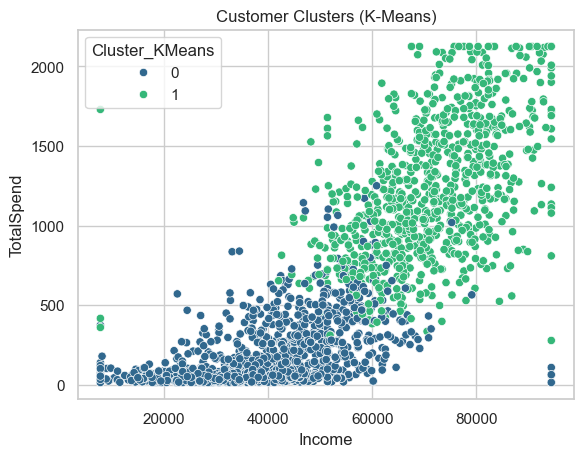

In [105]:
sns.scatterplot(data=df, x='Income', y='TotalSpend', hue='Cluster_KMeans', palette='viridis')
plt.title('Customer Clusters (K-Means)')
plt.show()


In [109]:
# Summarize clusters by important behavior metrics
cluster_summary = df.groupby('Cluster_KMeans')[['Loyalty_Score', 'Recency', 'TotalSpend']].mean().round(2)
print(cluster_summary)

# Automatically detect cluster roles
loyal_cluster = cluster_summary['Loyalty_Score'].idxmax()   # highest loyalty
less_recent_cluster = cluster_summary['Recency'].idxmax()   # highest recency (less recent purchases)

print(f"\nCluster {loyal_cluster} → Happy and Loyal Customers ")
print(f"Cluster {less_recent_cluster} → Less Recent Purchases ")


                Loyalty_Score  Recency  TotalSpend
Cluster_KMeans                                    
0                       28.66    48.77      181.46
1                       40.78    49.60     1217.17

Cluster 1 → Happy and Loyal Customers 
Cluster 1 → Less Recent Purchases 


In [110]:
# Average demographics per cluster
demo_summary = df.groupby('Cluster_KMeans')[['Age', 'Kidhome', 'Teenhome']].mean().round(1)
demo_summary['Family_Size'] = demo_summary['Kidhome'] + demo_summary['Teenhome'] + 2  # assuming 2 adults
demo_summary


,Age,Kidhome,Teenhome,Family_Size
Cluster_KMeans,,,,
0,54.8,0.7,0.6,3.3
1,58.3,0.1,0.4,2.5


In [111]:
cat_summary = df.groupby('Cluster_KMeans')[['Education', 'Marital_Status']].agg(lambda x: x.value_counts().index[0])
cat_summary


,Education,Marital_Status
Cluster_KMeans,,
0,Graduation,Married
1,Graduation,Married


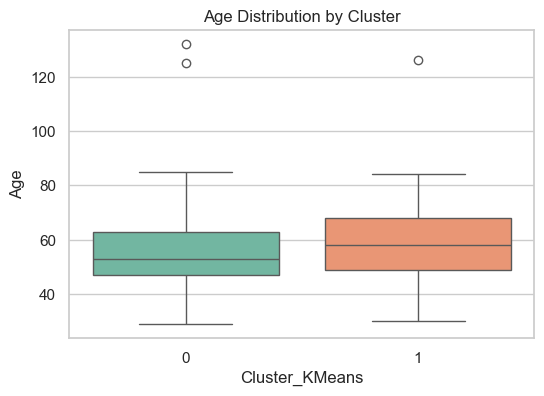

In [113]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
sns.boxplot(data=df, x='Cluster_KMeans', y='Age', palette='Set2')
plt.title('Age Distribution by Cluster')
plt.show()


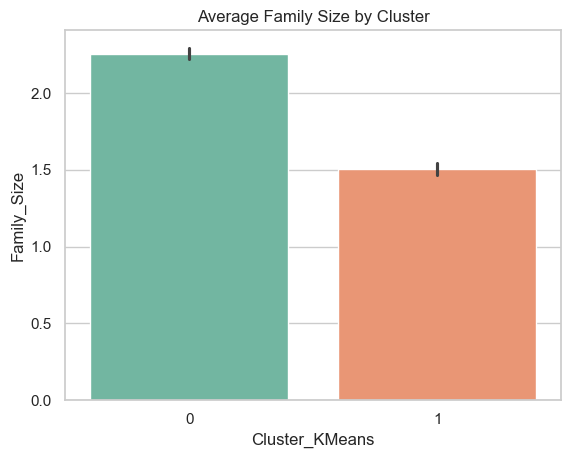

In [114]:
sns.barplot(data=df, x='Cluster_KMeans', y='Family_Size', palette='Set2')
plt.title('Average Family Size by Cluster')
plt.show()


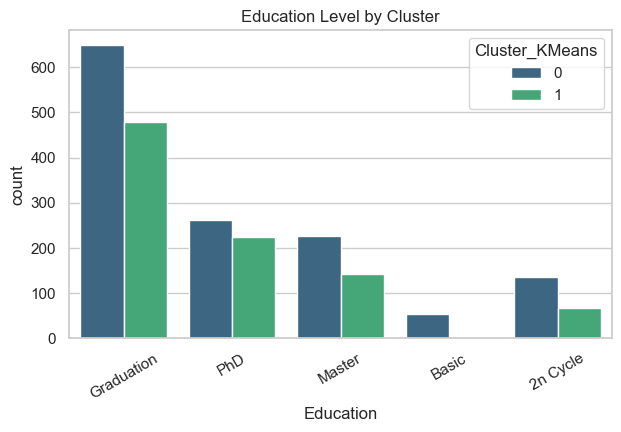

In [115]:
plt.figure(figsize=(7,4))
sns.countplot(data=df, x='Education', hue='Cluster_KMeans', palette='viridis')
plt.title('Education Level by Cluster')
plt.xticks(rotation=30)
plt.show()


In [117]:
# Select columns for profiling
product_cols = ['MntWines', 'MntFruits', 'MntMeatProducts', 
                'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']

demo_cols = ['Age', 'Income', 'Education', 'Marital_Status']
behavior_cols = ['TotalSpend', 'Recency', 'Loyalty_Score', 'CampaignAcceptedCount']

# Combine all for profiling
profile_cols = demo_cols + product_cols + behavior_cols

# Ensure columns exist
profile_cols = [c for c in profile_cols if c in df.columns]

# Create summary
cluster_profile = df.groupby('Cluster_KMeans')[profile_cols].agg(
    {
        'Age': 'mean',
        'Income': 'mean',
        'TotalSpend': 'mean',
        'Recency': 'mean',
        'Loyalty_Score': 'mean',
        'CampaignAcceptedCount': 'mean',
        'MntWines': 'mean',
        'MntFruits': 'mean',
        'MntMeatProducts': 'mean',
        'MntFishProducts': 'mean',
        'MntSweetProducts': 'mean',
        'MntGoldProds': 'mean',
        'Education': lambda x: x.value_counts().index[0],
        'Marital_Status': lambda x: x.value_counts().index[0],
    }
).round(2)

cluster_profile['Count'] = df['Cluster_KMeans'].value_counts().sort_index()
cluster_profile


,Age,Income,TotalSpend,Recency,Loyalty_Score,CampaignAcceptedCount,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Education,Marital_Status,Count
Cluster_KMeans,,,,,,,,,,,,,,,
0,54.76,38418.48,181.46,48.77,28.66,0.11,94.43,7.43,37.52,10.89,7.57,23.56,Graduation,Married,1326
1,58.28,71133.06,1217.17,49.60,40.78,0.58,607.88,53.68,354.72,76.16,55.35,73.70,Graduation,Married,914


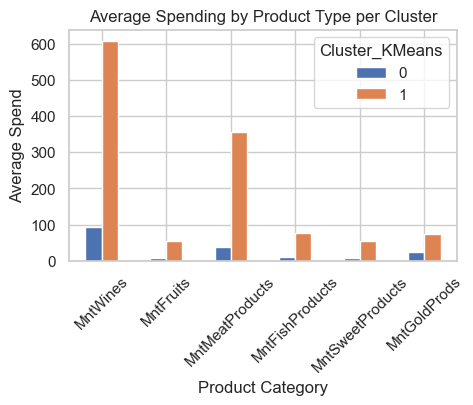

In [118]:
import matplotlib.pyplot as plt

product_means = df.groupby('Cluster_KMeans')[product_cols].mean()
product_means.T.plot(kind='bar', figsize=(5,3))
plt.title('Average Spending by Product Type per Cluster')
plt.ylabel('Average Spend')
plt.xlabel('Product Category')
plt.xticks(rotation=45)
plt.show()


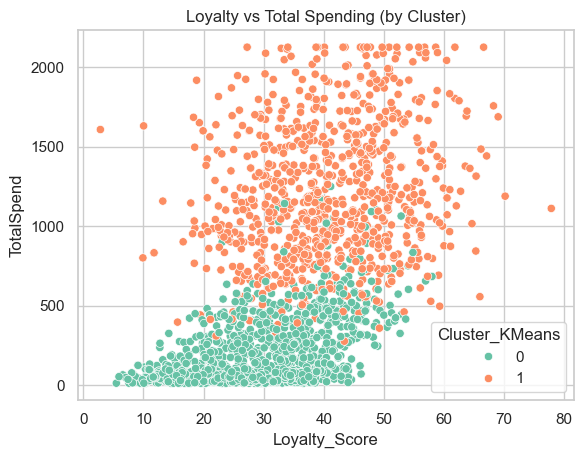

Correlation between Loyalty and Spending: 0.55


In [120]:
sns.scatterplot(data=df, x='Loyalty_Score', y='TotalSpend', hue='Cluster_KMeans', palette='Set2')
plt.title('Loyalty vs Total Spending (by Cluster)')
plt.show()

corr = df['Loyalty_Score'].corr(df['TotalSpend'])
print(f"Correlation between Loyalty and Spending: {corr:.2f}")

In [121]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [122]:
# Features for clustering
features = ['Age', 'Income', 'TotalSpend', 'Recency', 
            'Customer_Tenure_Days', 'CampaignAcceptedCount', 'Loyalty_Score']

# Scale data
X = df[features].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3D PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(X_scaled)

# Add to DataFrame
df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]
df['PCA3'] = pca_result[:, 2]


In [124]:
cluster_names = {0:'Less Recent Purchases' , 1: 'Happy and Loyal'}
df['Cluster_Label'] = df['Cluster_KMeans'].map(cluster_names)


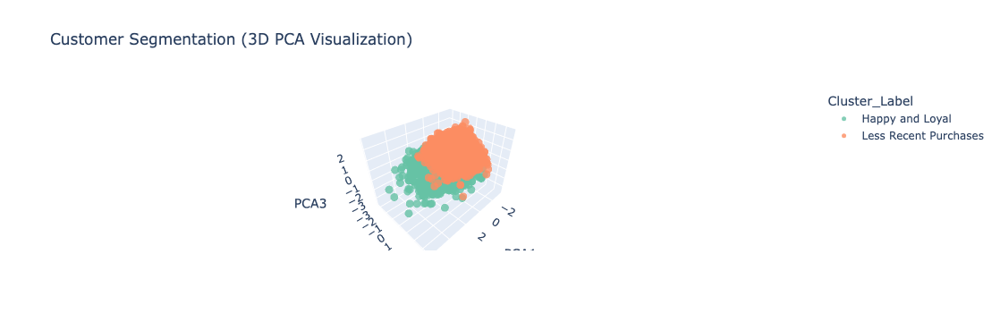

In [125]:
fig = px.scatter_3d(
    df,
    x='PCA1', y='PCA2', z='PCA3',
    color='Cluster_Label',  # or 'Cluster'
    hover_data=['Age', 'Income', 'Loyalty_Score', 'TotalSpend'],
    title='Customer Segmentation (3D PCA Visualization)',
    color_discrete_sequence=px.colors.qualitative.Set2
)
fig.update_traces(marker=dict(size=5, opacity=0.8))
fig.show()


In [ ]:

import os
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Step 1: Define feature list
cluster_features = [
    'Income', 'Age', 'TotalSpend', 'Family_Size', 'Recency',
    'NumWebPurchases', 'NumStorePurchases', 'NumCatalogPurchases',
    'NumWebVisitsMonth', 'Spend_per_Visit', 'Deal_Ratio',
    'CampaignAcceptedCount', 'Customer_Tenure_Days',
    'Education_enc', 'Marital_Status_enc'
]

# Step 2: Encode categorical features if missing
if 'Education_enc' not in df.columns and 'Education' in df.columns:
    df['Education_enc'] = df['Education'].astype('category').cat.codes

if 'Marital_Status_enc' not in df.columns and 'Marital_Status' in df.columns:
    df['Marital_Status_enc'] = df['Marital_Status'].astype('category').cat.codes

# Step 3: Check that all features exist
missing = [c for c in cluster_features if c not in df.columns]
if missing:
    print("⚠️ Missing columns:", missing)
else:
    print("✅ All columns present!")

# Step 4: Extract feature data
X = df[cluster_features].copy()

# Step 5: Fit scaler and model
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_scaled)

# Step 6: Define save paths
save_dir = os.getcwd()  # Current working directory
scaler_path = os.path.join(save_dir, 'scaler.pkl')
model_path = os.path.join(save_dir, 'kmeans_model.pkl')

# Step 7: Save model and scaler
with open(scaler_path, 'wb') as f:
    pickle.dump(scaler, f)
with open(model_path, 'wb') as f:
    pickle.dump(kmeans, f)

print(f"Scaler and KMeans model have been saved successfully!")
print(f"Scaler path: {scaler_path}")
print(f"Model path: {model_path}")


✅ All columns present!
✅ Scaler and KMeans model have been saved successfully!
📂 Scaler path: /Users/skr/customer_segmentation/scaler.pkl
📂 Model path: /Users/skr/customer_segmentation/kmeans_model.pkl


In [142]:
# Assuming your KMeans clusters are stored in df['Cluster_KMeans']

# Identify which cluster corresponds to 'loyal' and 'less recent'
# You can find this by checking mean Recency and Loyalty_Score for each cluster
cluster_summary = df.groupby('Cluster_KMeans')[['Recency', 'Loyalty_Score', 'TotalSpend']].mean()
print(cluster_summary)


                  Recency  Loyalty_Score   TotalSpend
Cluster_KMeans                                       
0               48.771493      28.664733   181.462293
1               49.599562      40.781587  1217.170678


In [143]:
# Create subsets for each cluster
loyal_df = df[df['Cluster_KMeans'] == 0].copy()
less_recent_df = df[df['Cluster_KMeans'] == 1].copy()


In [144]:
def spending_category(x, threshold):
    return 'High Spending' if x >= threshold else 'Low Spending'

loyal_threshold = loyal_df['TotalSpend'].median()
recent_threshold = less_recent_df['TotalSpend'].median()

loyal_df['Spending_Group'] = loyal_df['TotalSpend'].apply(lambda x: spending_category(x, loyal_threshold))
less_recent_df['Spending_Group'] = less_recent_df['TotalSpend'].apply(lambda x: spending_category(x, recent_threshold))


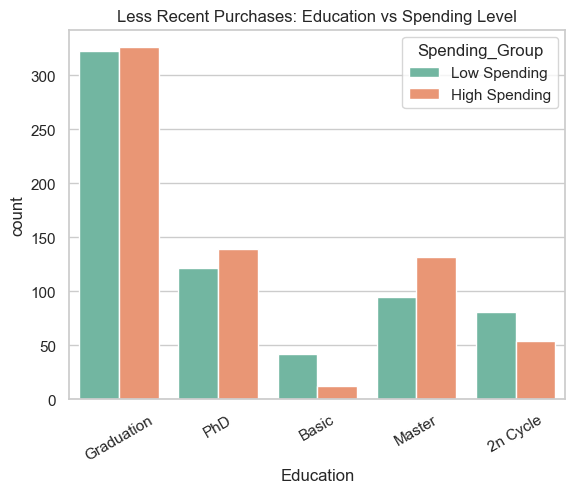

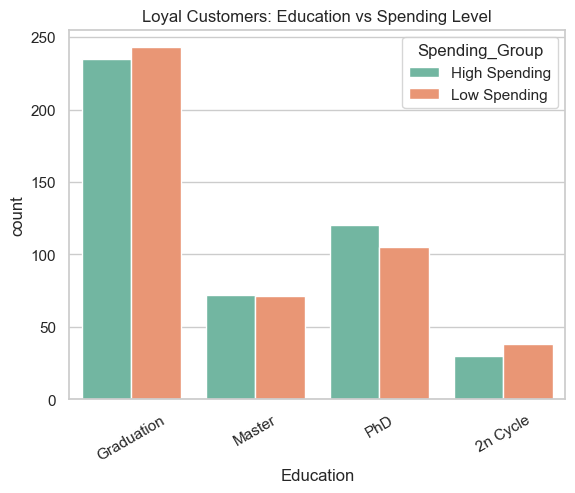

In [145]:
sns.countplot(data=loyal_df, x='Education', hue='Spending_Group', palette='Set2')
plt.title('Less Recent Purchases: Education vs Spending Level')
plt.xticks(rotation=30)
plt.show()

sns.countplot(data=less_recent_df, x='Education', hue='Spending_Group', palette='Set2')
plt.title('Loyal Customers: Education vs Spending Level')
plt.xticks(rotation=30)
plt.show()


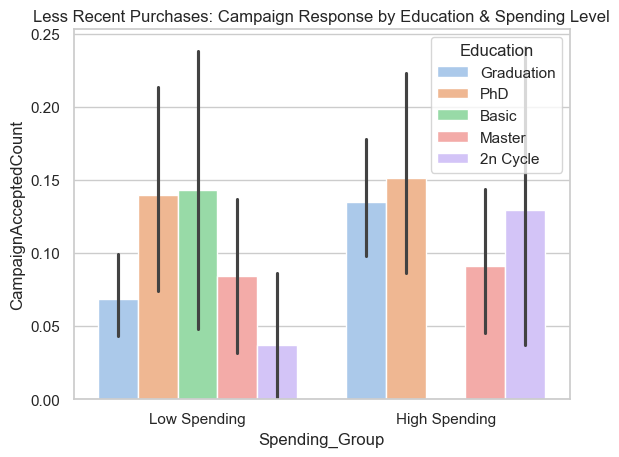

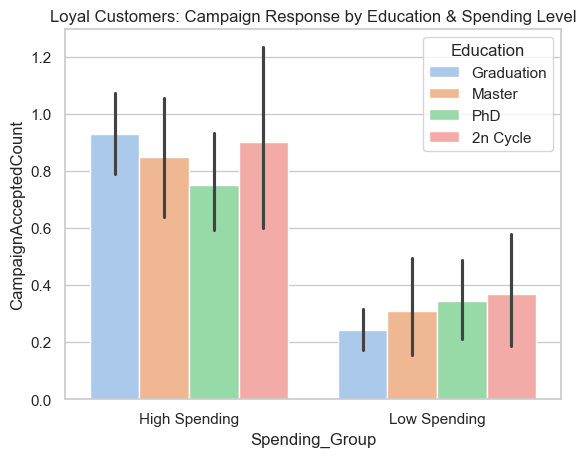

In [146]:
sns.barplot(data=loyal_df, x='Spending_Group', y='CampaignAcceptedCount', hue='Education', palette='pastel')
plt.title('Less Recent Purchases: Campaign Response by Education & Spending Level')
plt.show()

sns.barplot(data=less_recent_df, x='Spending_Group', y='CampaignAcceptedCount', hue='Education', palette='pastel')
plt.title('Loyal Customers: Campaign Response by Education & Spending Level')
plt.show()


In [147]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Choose numeric features relevant for subclustering
sub_features = ['Income', 'TotalSpend', 'Recency', 'CampaignAcceptedCount']

# Loyal group sub-clustering
scaler = StandardScaler()
X_loyal = scaler.fit_transform(loyal_df[sub_features])
kmeans_loyal = KMeans(n_clusters=2, random_state=42)
loyal_df['SubCluster'] = kmeans_loyal.fit_predict(X_loyal)

# Less recent group sub-clustering
X_recent = scaler.fit_transform(less_recent_df[sub_features])
kmeans_recent = KMeans(n_clusters=2, random_state=42)
less_recent_df['SubCluster'] = kmeans_recent.fit_predict(X_recent)


In [148]:
print("Less Recent Purchases Sub-Cluster Counts:")
print(loyal_df['SubCluster'].value_counts())
print("\n Loyal Customers Sub-Cluster Counts:")
print(less_recent_df['SubCluster'].value_counts())


Less Recent Purchases Sub-Cluster Counts:
SubCluster
0    882
1    444
Name: count, dtype: int64

 Loyal Customers Sub-Cluster Counts:
SubCluster
1    614
0    300
Name: count, dtype: int64


In [149]:
# For loyal group
loyal_summary = loyal_df.groupby('SubCluster')[sub_features].mean().round(2)
print("\nLess Recent Purchases Sub-Cluster Summary:")
print(loyal_summary)

# For less recent group
recent_summary = less_recent_df.groupby('SubCluster')[sub_features].mean().round(2)
print("Loyal Customers Sub-Cluster Summary:")
print(recent_summary)



Less Recent Purchases Sub-Cluster Summary:
              Income  TotalSpend  Recency  CampaignAcceptedCount
SubCluster                                                      
0           31756.06       73.51    48.95                   0.06
1           51653.29      395.92    48.43                   0.19
Loyal Customers Sub-Cluster Summary:
              Income  TotalSpend  Recency  CampaignAcceptedCount
SubCluster                                                      
0           80797.88     1650.63    51.61                   1.37
1           66410.83     1005.38    48.62                   0.19


In [150]:
def describe_subcluster(df, name):
    summary = df.groupby('SubCluster')[['Income','TotalSpend','Recency','CampaignAcceptedCount']].mean().round(2)
    print(f"\n{name} Sub-Cluster Insights:")
    for i in summary.index:
        print(f"SubCluster {i}:")
        print(f"  Avg Income: {summary.loc[i, 'Income']}")
        print(f"  Avg Spend: {summary.loc[i, 'TotalSpend']}")
        print(f"  Avg Recency: {summary.loc[i, 'Recency']}")
        print(f"  Avg Campaign Accepted: {summary.loc[i, 'CampaignAcceptedCount']}\n")

describe_subcluster(loyal_df, "Less Recent Purchases ")
describe_subcluster(less_recent_df, "Loyal Customers")



Less Recent Purchases  Sub-Cluster Insights:
SubCluster 0:
  Avg Income: 31756.06
  Avg Spend: 73.51
  Avg Recency: 48.95
  Avg Campaign Accepted: 0.06

SubCluster 1:
  Avg Income: 51653.29
  Avg Spend: 395.92
  Avg Recency: 48.43
  Avg Campaign Accepted: 0.19


Loyal Customers Sub-Cluster Insights:
SubCluster 0:
  Avg Income: 80797.88
  Avg Spend: 1650.63
  Avg Recency: 51.61
  Avg Campaign Accepted: 1.37

SubCluster 1:
  Avg Income: 66410.83
  Avg Spend: 1005.38
  Avg Recency: 48.62
  Avg Campaign Accepted: 0.19



In [151]:
final_df = pd.concat([loyal_df, less_recent_df], ignore_index=True)
final_df.head()


,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Customer_Tenure_Days,Age,TotalSpend,Family_Size,CampaignAcceptedCount,AcceptedAnyCampaign,Spend_per_Visit,Deal_Ratio,Age_bin,Loyalty_Score,Cluster_KMeans,Cluster_Hier,Cluster_DBSCAN,Cluster_GMM,Cluster_Best,PCA1,PCA2,PCA3,Cluster_Label,Spending_Group,SubCluster
0,Graduation,Single,46344.0,1.0,1.0,2014-03-08,38.0,11.0,1.0,6.0,2.0,1.0,6.0,2.0,1.0,1.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,4233.0,71.0,27.0,3.0,0.0,0.0,4.500000,1.000000,60+,21.646597,0,0,-1,0,Less Purchase,-1.320393,0.480205,-1.551406,Less Recent Purchases,Low Spending,0
1,Graduation,Together,26646.0,1.0,0.0,2014-02-10,26.0,11.0,4.0,20.0,10.0,3.0,5.0,2.0,2.0,0.0,4.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,4259.0,41.0,53.0,2.0,0.0,0.0,7.571429,0.666667,41-50,29.052504,0,0,0,0,Less Purchase,-1.626482,-1.010757,-0.858837,Less Recent Purchases,Low Spending,0
2,PhD,Married,58293.0,1.0,0.0,2014-01-19,94.0,173.0,43.0,118.0,46.0,27.0,15.0,5.0,5.0,3.0,6.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,4281.0,44.0,422.0,2.0,0.0,0.0,70.333333,0.833333,41-50,17.652035,0,0,-1,0,Less Purchase,-1.406341,1.641606,0.342952,Less Recent Purchases,High Spending,1
3,Graduation,Divorced,55635.0,0.0,1.0,2012-11-13,34.0,235.0,65.0,164.0,50.0,49.0,27.0,4.0,7.0,3.0,7.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,4713.0,54.0,590.0,2.0,0.0,0.0,84.285714,0.500000,51-60,45.093879,0,1,-1,0,Less Purchase,0.679223,-1.229820,0.691300,Less Recent Purchases,High Spending,1
4,PhD,Married,33454.0,1.0,0.0,2013-05-08,32.0,76.0,10.0,56.0,3.0,1.0,23.0,2.0,4.0,0.0,4.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,4537.0,40.0,169.0,2.0,0.0,0.0,18.777778,0.400000,31-40,34.984499,0,0,0,0,Less Purchase,-0.921398,-1.429298,0.338473,Less Recent Purchases,High Spending,0


In [157]:
final_df = pd.concat([loyal_df, less_recent_df], ignore_index=True)
final_df['MainCluster'] = final_df['Cluster_KMeans']
final_df['CombinedCluster'] = final_df['MainCluster'].astype(str) + "_" + final_df['SubCluster'].astype(str)


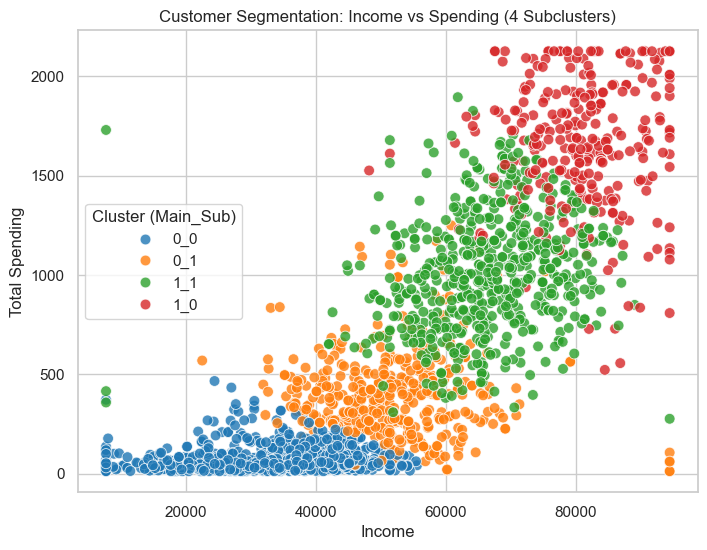

In [158]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=final_df,
    x='Income', y='TotalSpend',
    hue='CombinedCluster',
    palette='tab10',
    alpha=0.8,
    s=60
)
plt.title('Customer Segmentation: Income vs Spending (4 Subclusters)')
plt.xlabel('Income')
plt.ylabel('Total Spending')
plt.legend(title='Cluster (Main_Sub)')
plt.show()


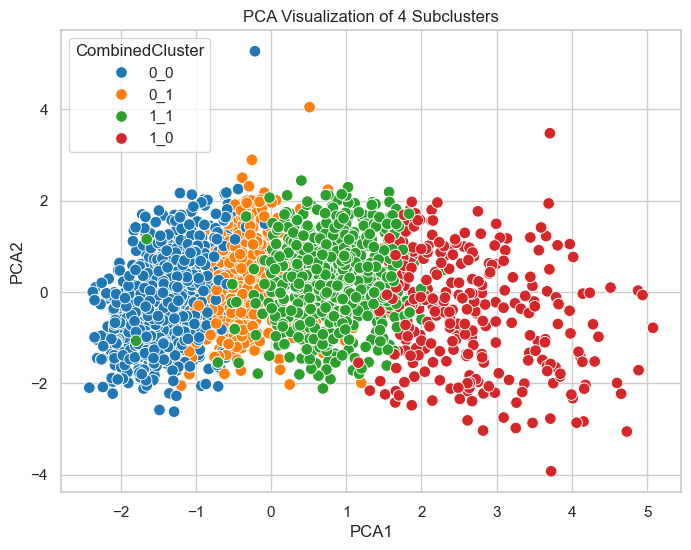

In [159]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

features = ['Income','TotalSpend','Recency','CampaignAcceptedCount','Age']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(final_df[features])

pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)
final_df['PCA1'], final_df['PCA2'] = pca_result[:,0], pca_result[:,1]

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=final_df,
    x='PCA1', y='PCA2',
    hue='CombinedCluster',
    palette='tab10',
    s=70
)
plt.title('PCA Visualization of 4 Subclusters')
plt.show()


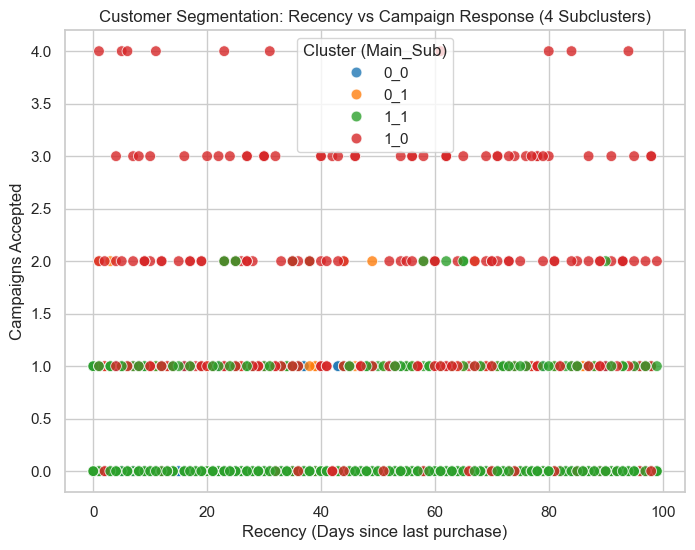

In [160]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=final_df,
    x='Recency', y='CampaignAcceptedCount',
    hue='CombinedCluster',
    palette='tab10',
    alpha=0.8,
    s=60
)
plt.title('Customer Segmentation: Recency vs Campaign Response (4 Subclusters)')
plt.xlabel('Recency (Days since last purchase)')
plt.ylabel('Campaigns Accepted')
plt.legend(title='Cluster (Main_Sub)')
plt.show()


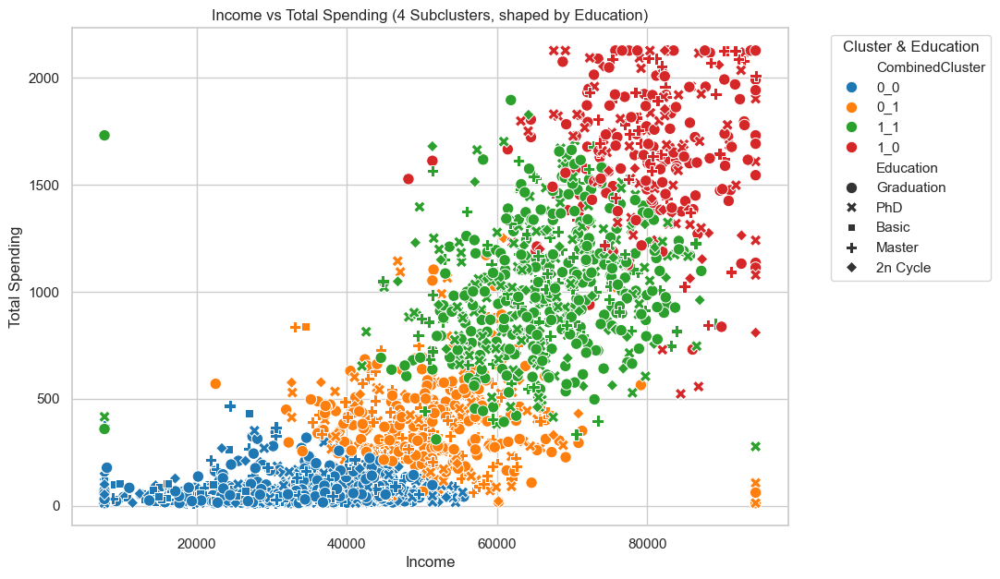

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,7))
sns.scatterplot(
    data=final_df,
    x='Income', y='TotalSpend',
    hue='CombinedCluster',
    style='Education',
    palette='tab10',
    s=80
)
plt.title('Income vs Total Spending (4 Subclusters, shaped by Education)')
plt.xlabel('Income')
plt.ylabel('Total Spending')
plt.legend(title='Cluster & Education', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


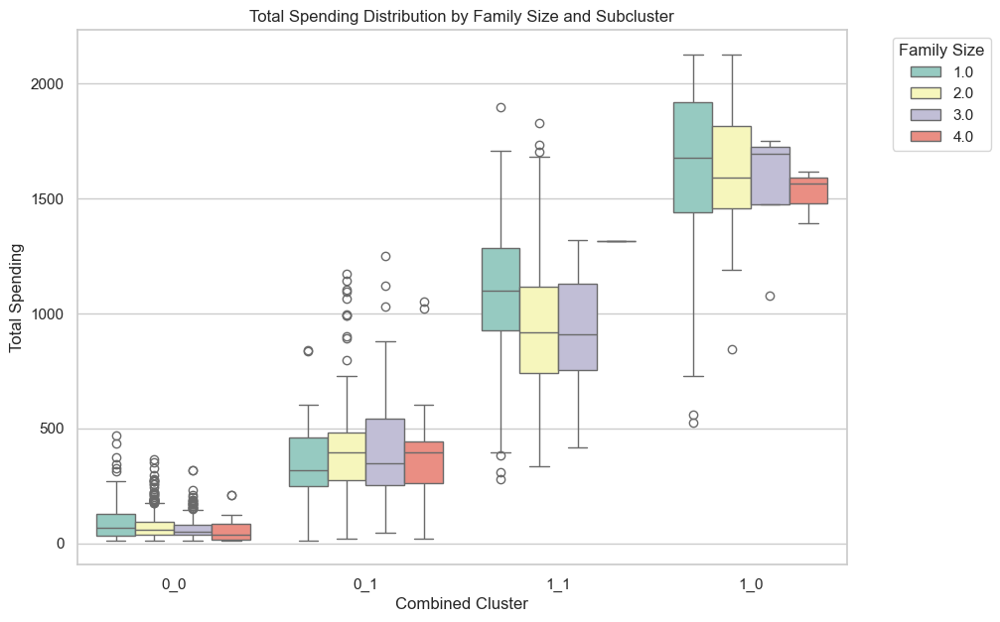

In [162]:
plt.figure(figsize=(10,7))
sns.boxplot(
    data=final_df,
    x='CombinedCluster', y='TotalSpend',
    hue='Family_Size',
    palette='Set3'
)
plt.title('Total Spending Distribution by Family Size and Subcluster')
plt.xlabel('Combined Cluster')
plt.ylabel('Total Spending')
plt.legend(title='Family Size', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


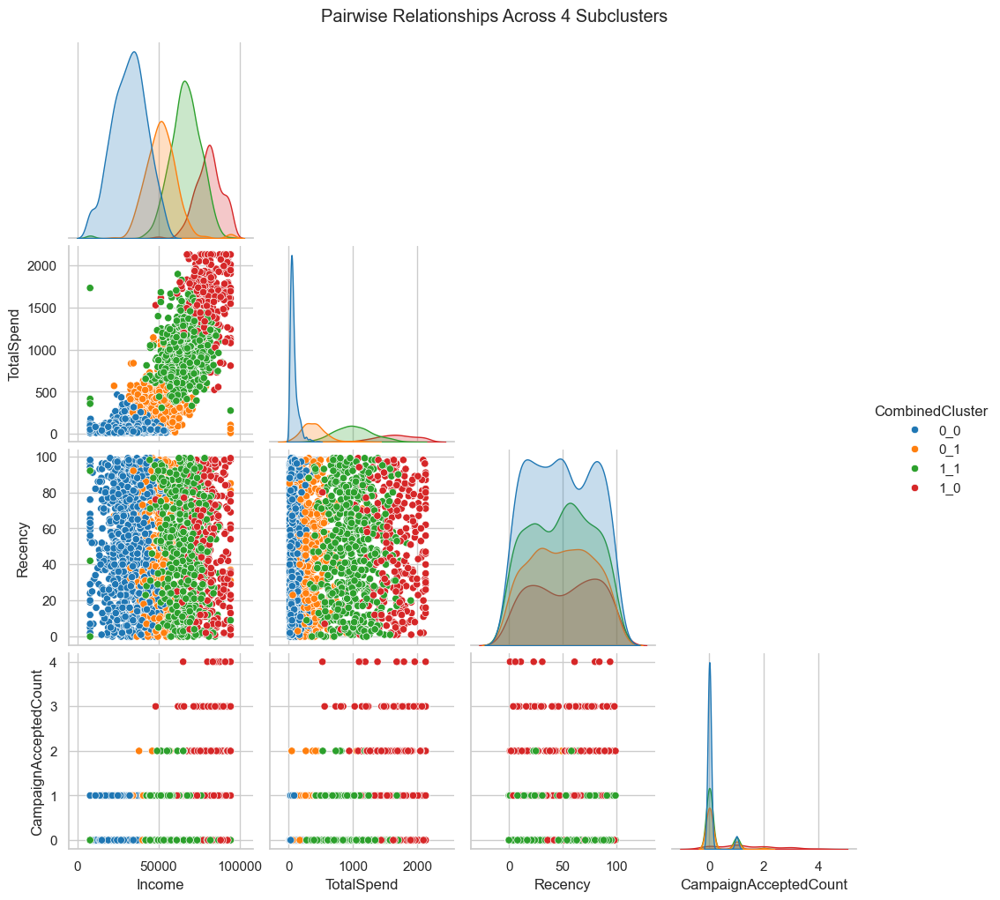

In [163]:
sns.pairplot(
    final_df,
    vars=['Income','TotalSpend','Recency','CampaignAcceptedCount'],
    hue='CombinedCluster',
    palette='tab10',
    corner=True
)
plt.suptitle('Pairwise Relationships Across 4 Subclusters', y=1.02)
plt.show()


In [165]:
import pickle

# Save the trained KMeans model
with open('kmeans_model.pkl', 'wb') as f:
    pickle.dump(kmeans, f)

# Save the scaler
with open('scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)


In [166]:
print(cluster_features)


['Income', 'Age', 'TotalSpend', 'Family_Size', 'Recency', 'NumWebPurchases', 'NumStorePurchases', 'NumCatalogPurchases', 'NumWebVisitsMonth', 'Spend_per_Visit', 'Deal_Ratio', 'CampaignAcceptedCount', 'Customer_Tenure_Days', 'Education_enc', 'Marital_Status_enc']
